To view display outputs in GitHub, follow to [nbviewer.org](https://nbviewer.org/github/briankim945/natural-ebert-processing/blob/master/Data%20Analysis/Data%20Exploration.ipynb)

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objects as go

import sklearn
import numpy as np
import pandas as pd

import random

import pickle

import nltk
import gensim
import pyLDAvis
import wordcloud
import textblob
import spacy
import textstat

/Users/briankim/opt/anaconda3/lib/python3.8/site-packages/h5py/__init__.py:46: DeprecationWarning:

`np.typeDict` is a deprecated alias for `np.sctypeDict`.



In [2]:
pyo.init_notebook_mode()

# Import Data

In [3]:
with open('../data/raw_filtered_reviews.pkl', 'rb') as f:
    raw_reviews_data = pickle.load(f)

In [4]:
random.sample(raw_reviews_data.items(), 1)

[('/reviews/daddy-day-care-2003',
  ('Daddy Day Care',
   'Roger Ebert',
   'May 09, 2003',
   1.0,
   ['"Daddy Day Care" is a woeful miscalculation, a film so wrong-headed audiences will be more appalled than amused. It imagines Eddie Murphy and sidekick Jeff Garlin in charge of a day-care center that could only terrify parents in the audience, although it may look like fun for their children. The center\'s philosophy apparently consists of letting kids do whatever they feel like, while the amateur staff delivers one-liners.',
    "I realize that the movie is not intended as a serious work about day-care centers. It is a comedy (in genre, not in effect). But at some point we might expect it to benefit from real life, real experiences, real kids. Not a chance. It's all simply a prop for the Eddie Murphy character. Aggressively simple-minded, it's fueled by the delusion that it has a brilliant premise: Eddie Murphy plus cute kids equals success. But a premise should be the starting poin

# Create DataFrame

In [5]:
raw_df = pd.DataFrame(
    {
        'url': item[0],
        'title': item[1][0],
        'author': item[1][1],
        'date': item[1][2],
        'stars': item[1][3],
        'body': ' '.join(item[1][4]),
    } for item in raw_reviews_data.items()
)

In [6]:
len(raw_df.index)

14508

In [7]:
raw_df.head()

,url,title,author,date,stars,body
0,/reviews/pictures-of-ghosts-film-review-2024,Pictures of Ghosts,Glenn Kenny,"January 26, 2024",3.5,"The one constant of life is change, and our ow..."
1,/reviews/t%C3%B3tem-movie-review-2024,Totem,Peyton Robinson,"January 26, 2024",4.0,"Whilst driving across a bridge, seven-year-old..."
2,/reviews/under-the-fig-trees-film-review-2024,Under the Fig Trees,Carlos Aguilar,"January 26, 2024",3.5,Faces and fruits flourish in the resplendent T...
3,/reviews/sometimes-i-think-about-dying-movie-r...,Sometimes I Think About Dying,Sheila O'Malley,"January 26, 2024",2.5,Fran (Daisy Ridley) is the central character o...
4,/reviews/the-peasants-film-review-2024,The Peasants,Tomris Laffly,"January 26, 2024",2.0,Here’s the first thing you need to know about ...


# Metadata Analysis

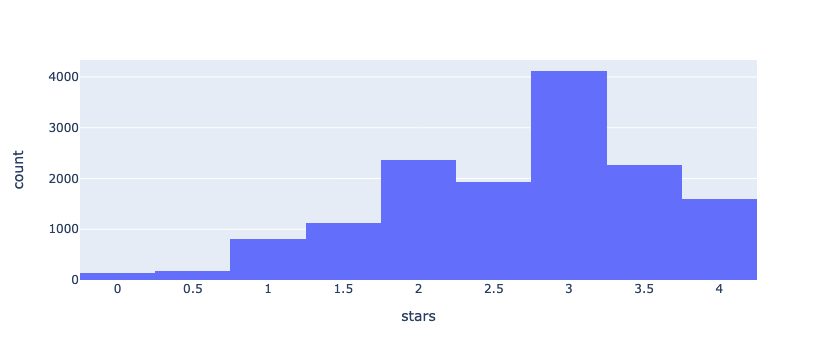

In [9]:
fig = px.histogram(raw_df, x="stars")
fig.show()

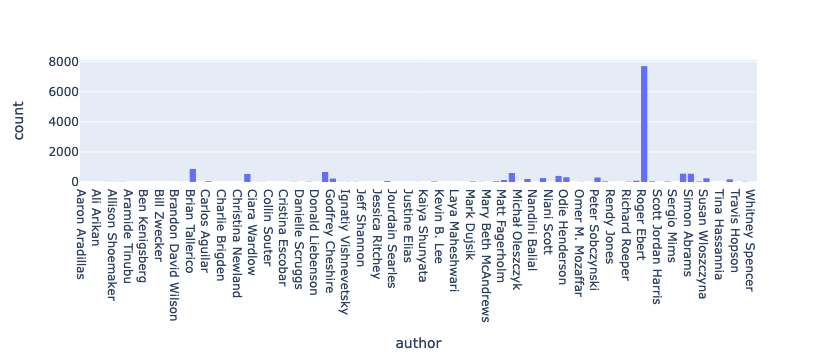

In [10]:
fig = px.histogram(raw_df, x="author").update_xaxes(categoryorder='category ascending')
fig.show()

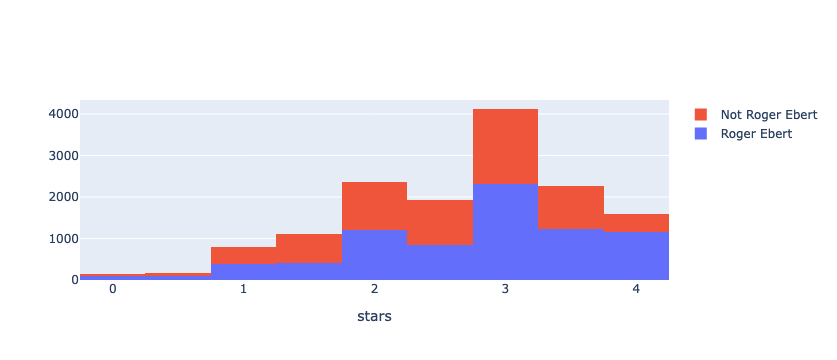

In [14]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=raw_df[raw_df['author'] == 'Roger Ebert']['stars'], name='Roger Ebert'))
fig.add_trace(go.Histogram(x=raw_df[raw_df['author'] != 'Roger Ebert']['stars'], name='Not Roger Ebert'))

# The two histograms are drawn on top of another
fig.update_layout(barmode='stack', xaxis_title='stars')
fig.show()

# Text Analysis

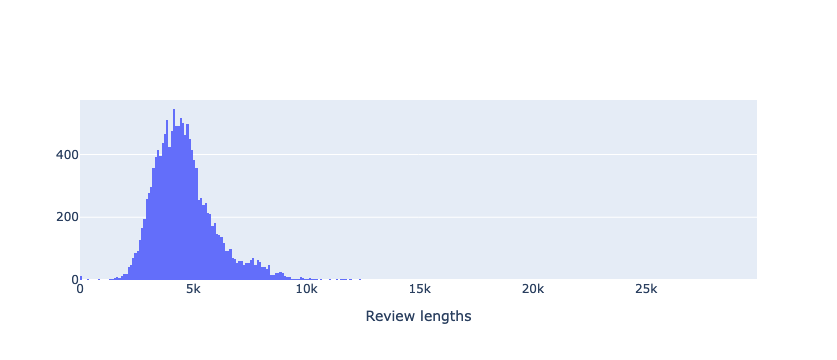

In [17]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=raw_df['body'].map(len), name='Review lengths'))

# The two histograms are drawn on top of another
fig.update_layout(xaxis_title='Review lengths')
fig.show()

In [20]:
raw_df[raw_df['body'].map(len) > 20000]

,url,title,author,date,stars,body
8950,/reviews/one-minute-reviews-2004,One Minute Reviews,Roger Ebert,"October 06, 2004",0.0,"""The Incredibles"" ***1/2 The new Pixar animate..."


Went back and removed this in Error Fixing

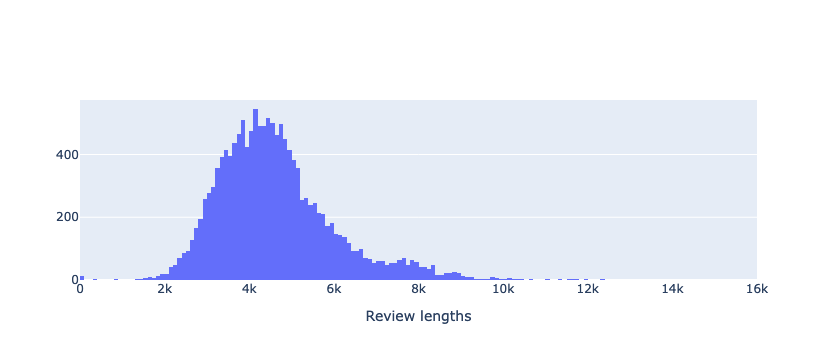

In [8]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=raw_df['body'].map(len), name='Review lengths'))

# The two histograms are drawn on top of another
fig.update_layout(xaxis_title='Review lengths')
fig.show()

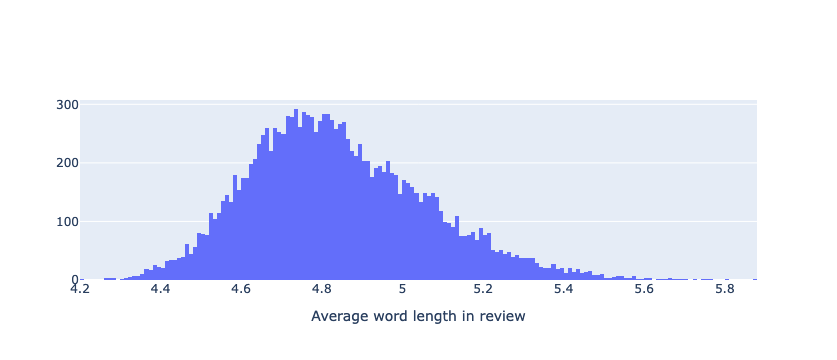

In [18]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=raw_df['body'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x))))

# The two histograms are drawn on top of another
fig.update_layout(xaxis_title='Average word length in review')
fig.show()

## Simplifying text data

In [79]:
cleaned_df = raw_df.copy()

In [80]:
from nltk.tokenize import RegexpTokenizer

def simplify_text(s):
    tokenizer = RegexpTokenizer(r'\w+')
    return ' '.join(tokenizer.tokenize(s)).lower()

In [81]:
cleaned_df.head()['body']

0    The one constant of life is change, and our ow...
1    Whilst driving across a bridge, seven-year-old...
2    Faces and fruits flourish in the resplendent T...
3    Fran (Daisy Ridley) is the central character o...
4    Here’s the first thing you need to know about ...
Name: body, dtype: object

In [82]:
cleaned_df['body'] = cleaned_df['body'].map(simplify_text)

In [83]:
cleaned_df.head()['body']

0    the one constant of life is change and our own...
1    whilst driving across a bridge seven year old ...
2    faces and fruits flourish in the resplendent t...
3    fran daisy ridley is the central character of ...
4    here s the first thing you need to know about ...
Name: body, dtype: object

Possible things to return to:

More specific/intentional lowercasing

Dealing with hyphens and apostrophe's (like in apostrophe's)

## Stopwords

In [8]:
from collections import defaultdict

In [9]:
nltk.download('stopwords')
from nltk.corpus import stopwords
stop = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/briankim/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [84]:
corpus = []
for text in cleaned_df['body']:
    corpus.extend(text.split())

In [85]:
counts = defaultdict(int)

for word in corpus:
    counts[word] += 1

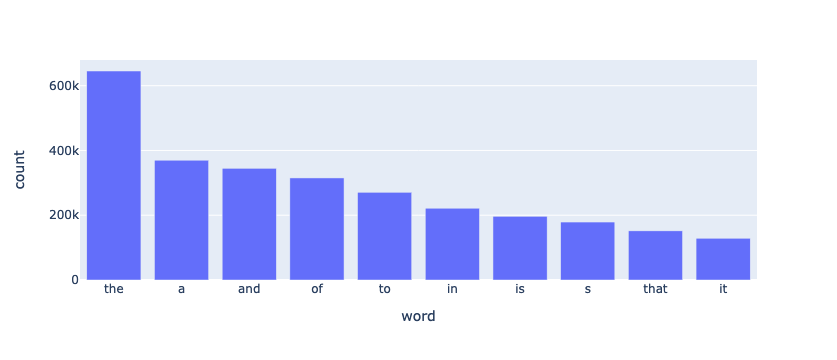

In [86]:
count_df = pd.DataFrame({'word': counts.keys(), 'count': counts.values()})

fig = px.bar(count_df.sort_values('count', ascending=False)[:10], x='word', y='count')
fig.show()

In [8]:
from collections import Counter

In [87]:
counter = Counter(corpus)

In [88]:
most = counter.most_common()

In [89]:
print(most[:20])

[('the', 645351), ('a', 369946), ('and', 344868), ('of', 315125), ('to', 270883), ('in', 221692), ('is', 196779), ('s', 178957), ('that', 151701), ('it', 128979), ('he', 100991), ('with', 98258), ('as', 95517), ('his', 94644), ('for', 80194), ('but', 76030), ('on', 73607), ('her', 66648), ('by', 62702), ('who', 62008)]


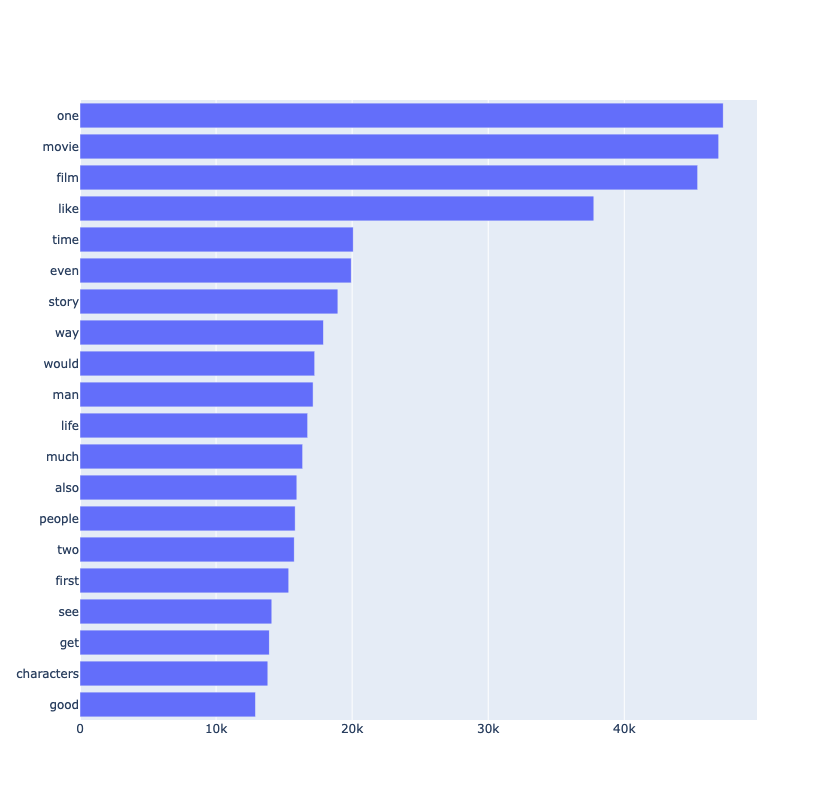

In [90]:
common_words = []
occurrences = []
i = 0

while len(common_words) < 20:
    word, count = most[i]
    if word not in stop:
        common_words.append(word)
        occurrences.append(count)
    i += 1

fig = go.Figure([go.Bar(y=list(reversed(common_words)), x=list(reversed(occurrences)), orientation='h')])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

# N-Grams

In [102]:
new = cleaned_df['body'].str.split()
new = new.values.tolist()
new_corpus = [word for i in new for word in i]

In [168]:
new_clean_corpus = ['is' if item == 's' else item for item in new_corpus]
new_clean_corpus = ['have' if item == 've' else item for item in new_clean_corpus]
new_clean_corpus = ['will' if item == 'll' else item for item in new_clean_corpus]
new_clean_corpus = ['are' if item == 're' else item for item in new_clean_corpus]

In [115]:
len(new_corpus)

11858599

In [103]:
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer

In [128]:
def get_ngrams(corpus, n=None):
    vec = CountVectorizer(stop_words=None, ngram_range=(n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx])
                  for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq

## Bigrams

In [129]:
bigrams = get_ngrams([' '.join(new_corpus)], 2)

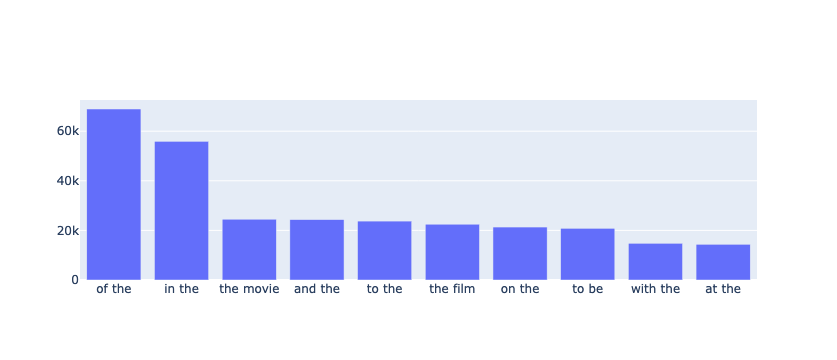

In [143]:
top_bigrams = bigrams[:10]
x, y = list(zip(*top_bigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

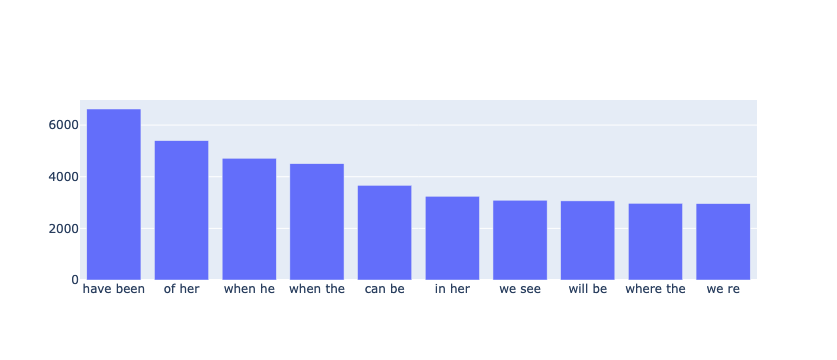

In [142]:
top_bigrams = []

for b in bigrams:
    if sum([1 if item in stop else 0 for item in b[0]]) < 2:
        top_bigrams.append(b)
    if len(top_bigrams) > 9:
        break

x, y = list(zip(*top_bigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

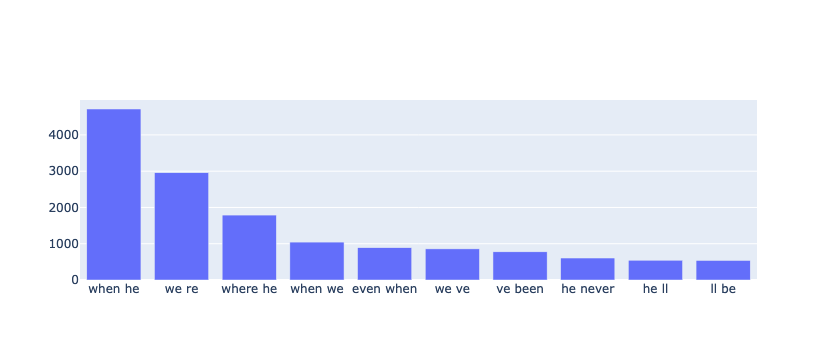

In [144]:
top_bigrams = []

for b in bigrams:
    if sum([1 if item in stop else 0 for item in b[0]]) < 1 and :
        top_bigrams.append(b)
    if len(top_bigrams) > 9:
        break

x, y = list(zip(*top_bigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

### Clean

In [157]:
bigrams = get_ngrams([' '.join(new_clean_corpus)], 2)

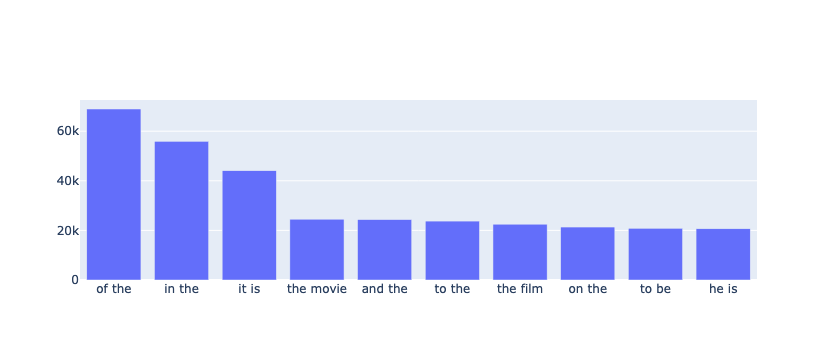

In [158]:
top_bigrams = bigrams[:10]
x, y = list(zip(*top_bigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

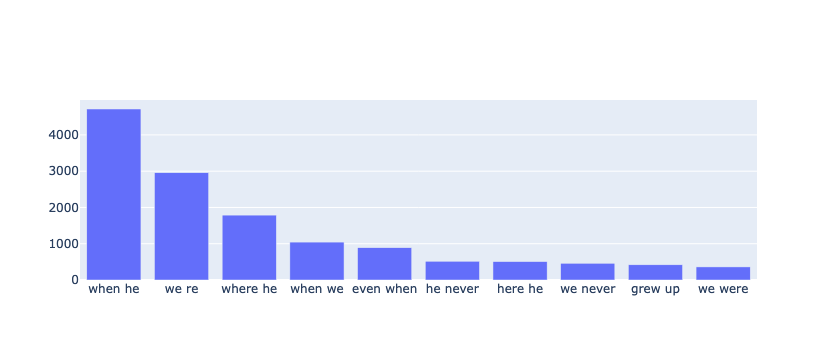

In [159]:
top_bigrams = []

for b in bigrams:
    if sum([1 if item in stop else 0 for item in b[0]]) < 1:
        top_bigrams.append(b)
    if len(top_bigrams) > 9:
        break

x, y = list(zip(*top_bigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

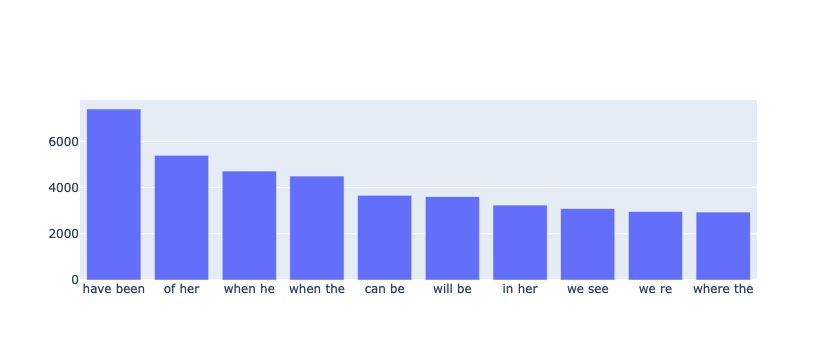

In [160]:
top_bigrams = []

for b in bigrams:
    if sum([1 if item in stop else 0 for item in b[0]]) < 2:
        top_bigrams.append(b)
    if len(top_bigrams) > 9:
        break

x, y = list(zip(*top_bigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

## Trigrams

In [167]:
trigrams = get_ngrams([' '.join(new_corpus)], 3)

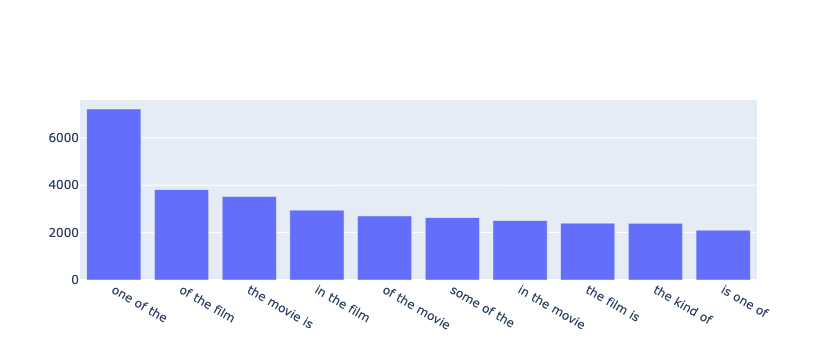

In [162]:
top_trigrams = trigrams[:10]
x, y = list(zip(*top_trigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

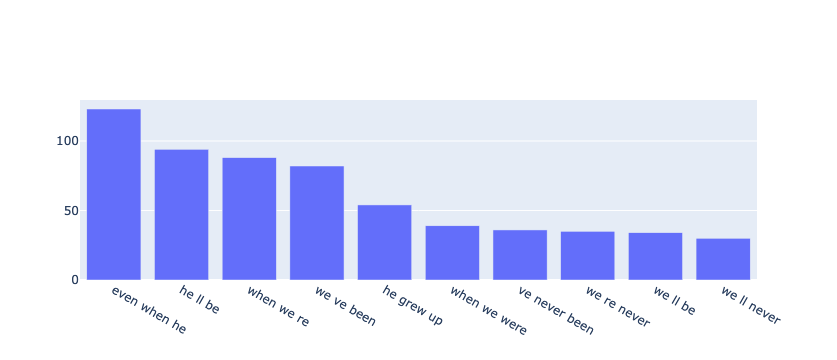

In [163]:
top_trigrams = []

for t in trigrams:
    if sum([1 if item in stop else 0 for item in t[0]]) < 1:
        top_trigrams.append(t)
    if len(top_trigrams) > 9:
        break

x, y = list(zip(*top_trigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

### Clean

In [164]:
trigrams = get_ngrams([' '.join(new_clean_corpus)], 3)

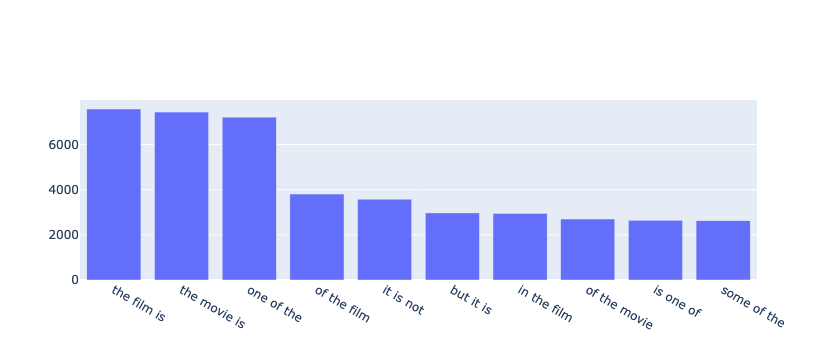

In [165]:
top_trigrams = trigrams[:10]
x, y = list(zip(*top_trigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

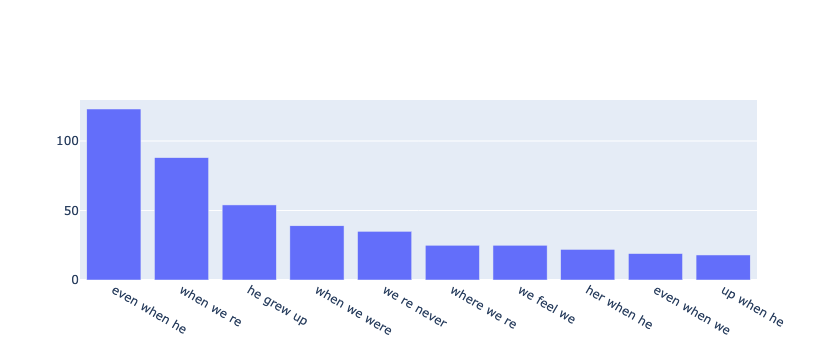

In [166]:
top_trigrams = []

for t in trigrams:
    if sum([1 if item in stop else 0 for item in t[0]]) < 1:
        top_trigrams.append(t)
    if len(top_trigrams) > 9:
        break

x, y = list(zip(*top_trigrams))
fig = go.Figure([go.Bar(x=x[:10], y=y[:10])])
fig.update_layout(
    autosize=False,
)
fig.show()

# pyLDAvis Topic Modeling

## Tokenize and lemmatize

In [10]:
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /Users/briankim/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/briankim/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [18]:
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize

In [12]:
def preprocess(texts):
    corpus = []
    stem = PorterStemmer()
    lem = WordNetLemmatizer()
    for text in texts:
        words = [word for word in word_tokenize(text) if word not in stop]
        words = [lem.lemmatize(word) for word in words if len(word) > 2]
        corpus.append(words)
    return corpus

In [13]:
corpus = preprocess(raw_df['body'])

In [14]:
dictionary = gensim.corpora.Dictionary(corpus)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

In [15]:
lda_model = gensim.models.LdaMulticore(bow_corpus,
                                   num_topics = 4,
                                   id2word = dictionary,
                                   passes = 10,
                                   workers = 2)
lda_model.show_topics()

[(0,
  '0.015*"movie" + 0.015*"The" + 0.008*"n\'t" + 0.007*"like" + 0.006*"one" + 0.005*"scene" + 0.004*"character" + 0.004*"get" + 0.004*"film" + 0.003*"time"'),
 (1,
  '0.016*"The" + 0.013*"movie" + 0.008*"film" + 0.007*"one" + 0.007*"n\'t" + 0.005*"like" + 0.004*"character" + 0.004*"scene" + 0.004*"life" + 0.004*"time"'),
 (2,
  '0.009*"The" + 0.007*"like" + 0.007*"movie" + 0.007*"film" + 0.005*"one" + 0.004*"character" + 0.004*"get" + 0.003*"even" + 0.003*"make" + 0.003*"But"'),
 (3,
  '0.010*"The" + 0.010*"film" + 0.006*"one" + 0.005*"like" + 0.003*"story" + 0.003*"make" + 0.003*"also" + 0.003*"But" + 0.003*"character" + 0.003*"time"')]

In [19]:
# with open('lda.pkl', 'wb') as f:
#     pickle.dump((lda_model, bow_corpus, dictionary), f, pickle.HIGHEST_PROTOCOL)

In [ ]:
with open('lda.pkl', 'rb') as f:
    lda_model, bow_corpus, dictionary = pickle.load(f)

In [16]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, bow_corpus, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.061084 -0.026303       1        1  44.503441
3     -0.029135 -0.063420       2        1  33.073320
0      0.053077  0.053495       3        1  13.342890
2     -0.085026  0.036229       4        1   9.080349, topic_info=        Term          Freq         Total Category  logprob  loglift
224    movie  58129.000000  58129.000000  Default  30.0000  30.0000
1111     n't  29297.000000  29297.000000  Default  29.0000  29.0000
59       The  85020.000000  85020.000000  Default  28.0000  28.0000
197     like  34613.000000  34613.000000  Default  27.0000  27.0000
162      get  19848.000000  19848.000000  Default  26.0000  26.0000
...      ...           ...           ...      ...      ...      ...
60     There   1013.482880  14962.744655   Topic4  -6.3452  -0.2931
810     know   1004.447116  14444.117980   Topic4  -6.3541  -0.2668
201     look    958.887565  10614.215207   Topic4  -6.4005  -0.0051
198   little    957.446841  10654.645732   Topic4  -6.4020  -0.0104
783     good    953.334127  11801.081818   Topic4  -6.4064  -0.1169

[442 rows x 6 columns], token_table=       Topic      Freq    Term
term                          
947        1  0.642421     're
947        2  0.051196     're
947        3  0.258772     're
947        4  0.047511     're
1          1  0.953527   1930s
...      ...       ...     ...
945        4  0.035373   young
19221      1  0.025615  zombie
19221      2  0.011822  zombie
19221      3  0.057142  zombie
19221      4  0.906384  zombie

[939 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 4, 1, 3])

# WordCloud

In [15]:
from wordcloud import WordCloud, STOPWORDS

In [16]:
stopwords = set(STOPWORDS)

In [17]:
def create_wordcloud(corpus):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=100,
        max_font_size=30,
        scale=3,
        random_state=1,
    )
    wordcloud = wordcloud.generate(str(corpus))
    return wordcloud

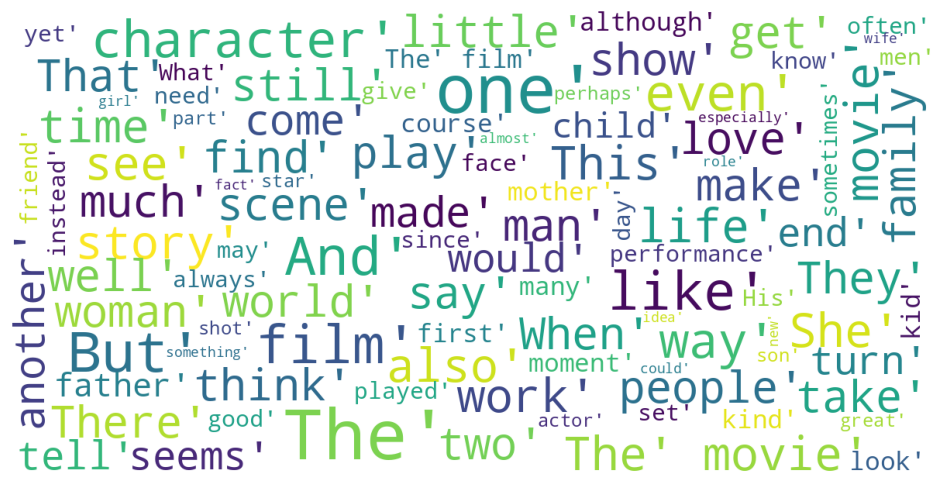

In [18]:
fig = plt.figure(1, figsize=(12,12))
plt.axis('off')
plt.imshow(create_wordcloud(corpus))
plt.show()

# Sentiment Analysis

## Textblob

In [19]:
from textblob import TextBlob

In [21]:
raw_df['polarity'] = raw_df['body'].apply(lambda x: TextBlob(x).sentiment.polarity)

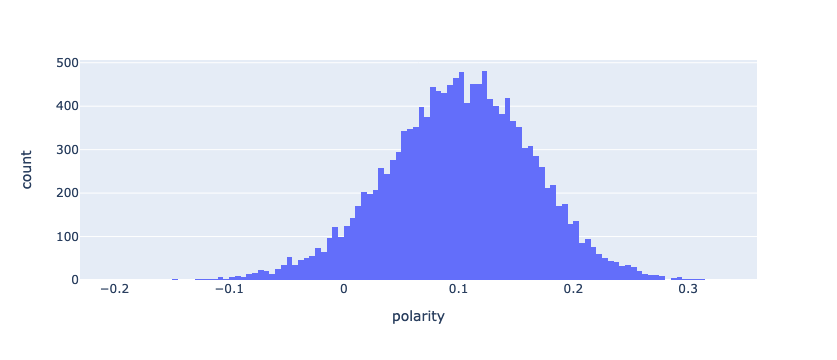

In [22]:
fig = px.histogram(raw_df, x="polarity")
fig.show()

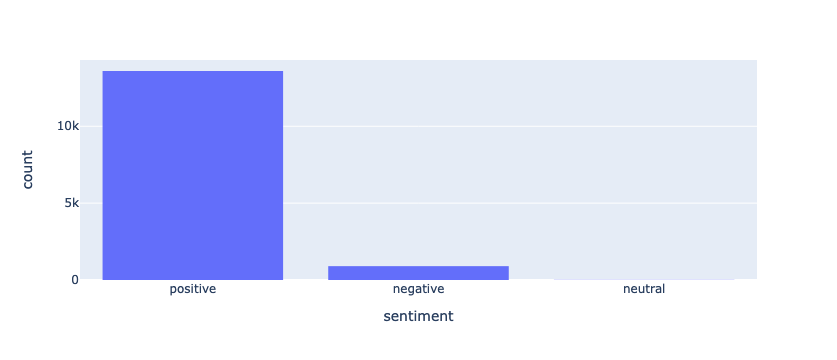

In [24]:
def sentiment_classify(polarity):
    if polarity < 0: return 'negative'
    elif polarity > 0: return 'positive'
    else: return 'neutral'

raw_df['sentiment'] = raw_df['polarity'].apply(sentiment_classify)

fig = px.histogram(raw_df, x="sentiment")
fig.show()

In [26]:
for text in raw_df[raw_df["sentiment"] == "positive"].head()['url']:
    print(text)

/reviews/pictures-of-ghosts-film-review-2024
/reviews/t%C3%B3tem-movie-review-2024
/reviews/under-the-fig-trees-film-review-2024
/reviews/sometimes-i-think-about-dying-movie-review-2024
/reviews/the-peasants-film-review-2024


In [27]:
for text in raw_df[raw_df["sentiment"] == "negative"].head()['url']:
    print(text)

/reviews/the-seeding-movie-review-2024
/reviews/founders-day-movie-review-2024
/reviews/the-breaking-ice-movie-review-2024
/reviews/the-settlers-movie-review-2024
/reviews/concrete-utopia-movie-review-2023


In [28]:
for text in raw_df[raw_df["sentiment"] == "neutral"].head()['url']:
    print(text)

/reviews/wal-mart-the-high-cost-of-low-price
/reviews/finding-home
/reviews/sharks-3d
/reviews/you-i-love-2005
/reviews/my-mother-likes-women


## Vader

In [29]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [30]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/briankim/nltk_data...


True

In [31]:
analyzer = SentimentIntensityAnalyzer()

def get_vader_sentiment(text):
    polarity = analyzer.polarity_scores(text)
    return np.argmax(list(polarity.values())[:-1])

In [32]:
raw_df['vader_polarity'] = raw_df['body'].apply(get_vader_sentiment)
raw_df['vader_polarity'] = raw_df['vader_polarity'].replace({0: 'negative', 1: 'neutral', 2: 'positive'})

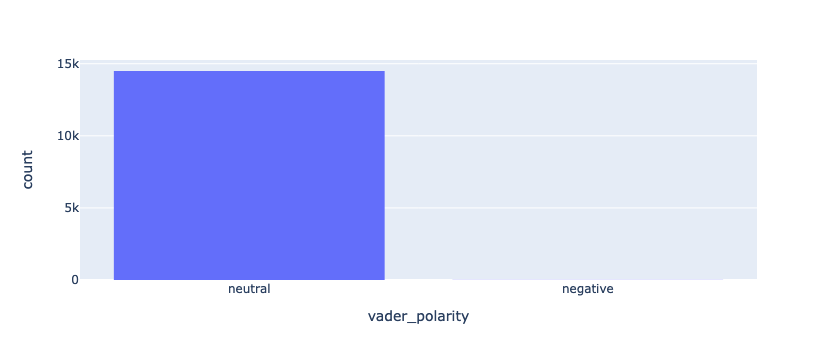

In [33]:
fig = px.histogram(raw_df, x="vader_polarity")
fig.show()

# Named Entity Recognition

## Spacy

In [9]:
nlp = spacy.load("en_core_web_sm")

In [10]:
from spacy import displacy

In [11]:
def ner(text):
    return nlp(text)

In [12]:
def get_labels(document):
    return [x.label_ for x in document.ents]

In [13]:
def by_label(document, label):
    return [x.text for x in document.ents if x.label_ == label]

In [14]:
documents = raw_df['body'].apply(ner)
labels = [get_labels(d) for d in documents]
labels = [x for i in labels for x in i]

counter = Counter(labels)
count = counter.most_common()

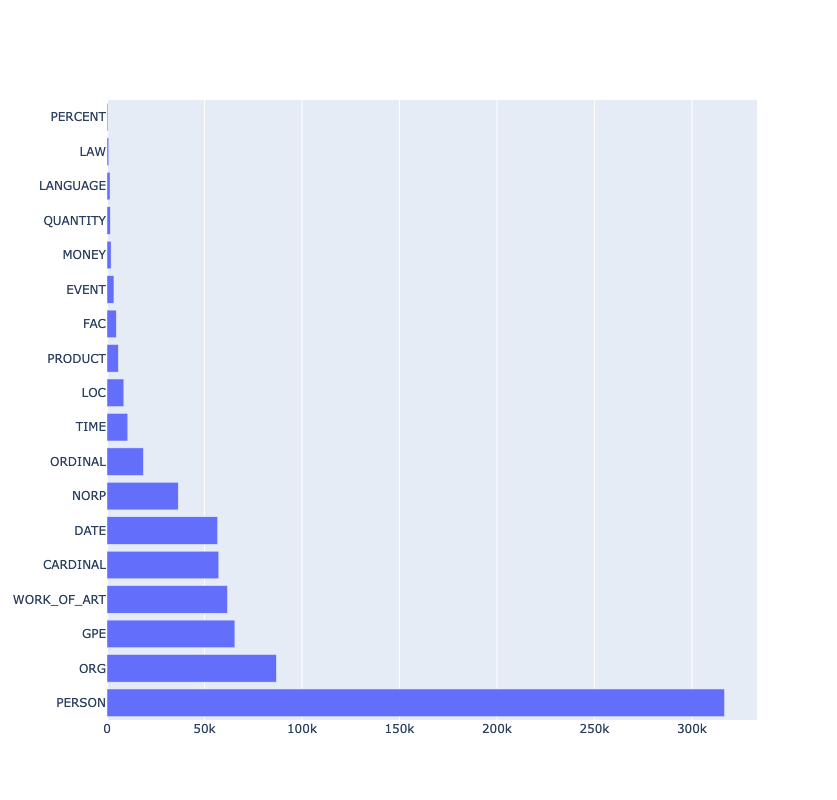

In [15]:
x, y = map(list, zip(*count))

fig = go.Figure([go.Bar(x=y, y=x, orientation='h')])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

In [16]:
with open('spacy_ner.pkl', 'wb') as f:
    pickle.dump(documents, f, pickle.HIGHEST_PROTOCOL)

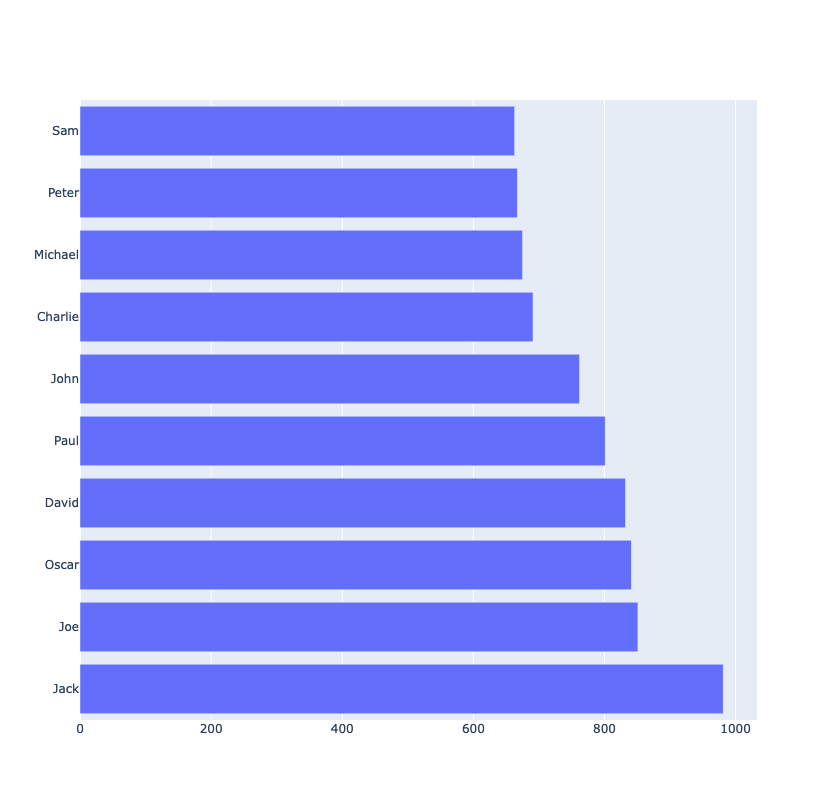

In [17]:
label = "PERSON"

label_items = [by_label(d, label) for d in documents]
label_items = [x for i in label_items for x in i]
counter = Counter(label_items)

x, y = map(list, zip(*counter.most_common(10)))

fig = go.Figure([go.Bar(x=y, y=x, orientation='h')])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

# Parts of Speech

In [23]:
def pos_find(text):
    pos = nltk.pos_tag(word_tokenize(text))
    return pos

In [31]:
# pos = raw_df['body'].apply(pos_find)

# with open('pos.pkl', 'wb') as f:
#     pickle.dump(pos, f)

with open('pos.pkl', 'rb') as f:
    pos = pickle.load(f)

In [37]:
tags = [x for l in pos for x in l]
tags = list(map(list,zip(*tags)))[1]
counter = Counter(tags)

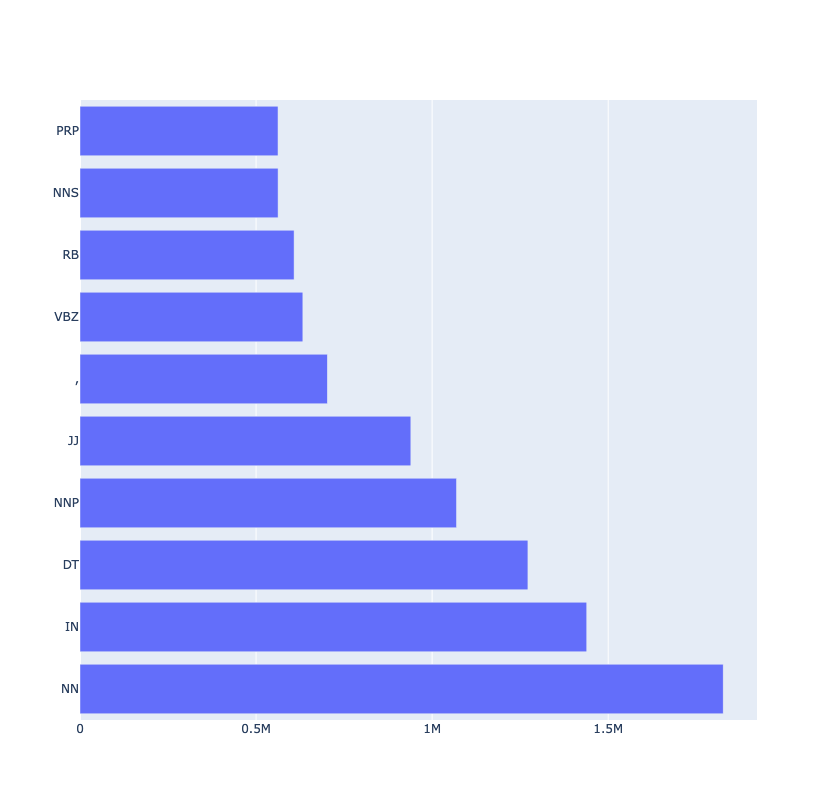

In [38]:
x, y = map(list, zip(*counter.most_common(10)))

fig = go.Figure([go.Bar(x=y, y=x, orientation='h')])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

In [45]:
def get_tags(pos, tag_input):
    tags = []
    for word, tag in pos:
        if tag == tag_input:
            tags.append(word)
    return tags

{2}


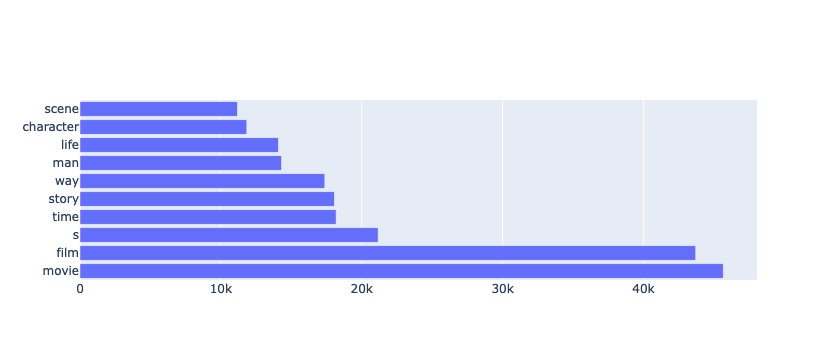

In [52]:
tag = 'NN'

pos_flat = [x for l in pos for x in l]
print(set([len(p) for p in pos_flat]))

words = get_tags(pos_flat, tag)
# words = [x for l in words for x in l]
counter = Counter(words)

x, y = map(list, zip(*counter.most_common(10)))

fig = go.Figure([go.Bar(x=y, y=x, orientation='h')])
# fig.update_layout(
#     autosize=False,
#     width=800,
#     height=800,
# )
fig.show()

# Text Complexity

In [53]:
from textstat import flesch_reading_ease

In [55]:
complexities = raw_df['body'].apply(flesch_reading_ease)

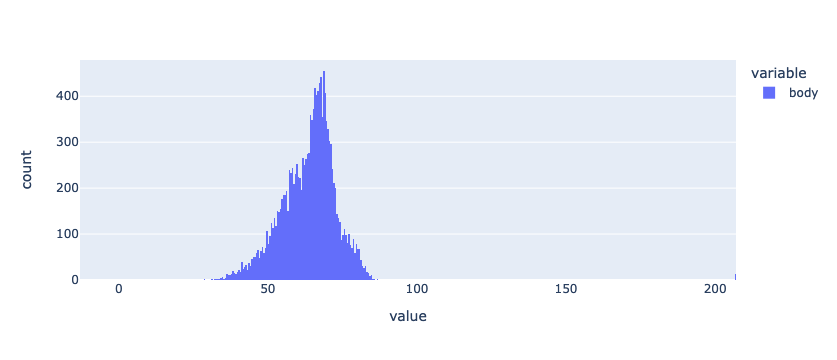

In [56]:
fig = px.histogram(complexities)
fig.show()

In [57]:
raw_df['url'][np.argmax(complexities)]

'/reviews/wal-mart-the-high-cost-of-low-price'

In [58]:
np.argmax(complexities)

8599

In [59]:
complexities[8599]

206.84

In [60]:
raw_df['body'][8599]

''